In [7]:
import os
import copy
import numpy as np
import pandas as pd
from matplotlib import cm
import matplotlib.pyplot as plt
from grid2op.Episode import EpisodeData

In [19]:
the_fontsize = 8
def _get_all_obs_values(observations, str_function):
    ans = []
    for i in range(1,len(observations)):
        ans.append(getattr(observations[i], str_function))
    return np.array(ans)

def _get_all_action_values(actions, action_key, n_gen=None):
    ans = []
    for i in range(len(actions)):
        act = actions[i].as_dict()
        try:
            spec_act = act[action_key]
        except KeyError:
            spec_act = [0 for i in range(n_gen)]
            
        ans.append(spec_act)
    return np.array(ans)

In [3]:
cases_path = 'D:\\ESDA_MSc\\Dissertation\\code_stuff\\cases'
folder_name = '_AGC_sandbox_DoNothing_Di24Reward_(AC_pqp)'
baseline_path = os.path.join(cases_path, folder_name)
ep_folders = [ep for ep in os.listdir(baseline_path) if os.path.isdir(os.path.join(baseline_path, ep)) and ep.startswith('00')]

In [55]:
res_case = {'lines': [], 'gen': []}
tsteps = []
for ep in ep_folders:
    this_episode = EpisodeData.from_disk(baseline_path, ep)
    obs = copy.deepcopy(this_episode.observations)
    act = copy.deepcopy(this_episode.actions)
    rho_sum = np.sum(np.abs(_get_all_obs_values(obs, 'rho')), axis=0)
    grho_sum = np.sum(_get_all_obs_values(obs, 'prod_p') / _get_all_obs_values(obs, 'gen_pmax'), axis=0)
    ovtsteps = np.sum(_get_all_obs_values(obs, 'timestep_overflow'), axis=1)
    res_case['lines'].append(rho_sum/len(obs))
    res_case['gen'].append(grho_sum/len(obs))
    tsteps.append(ovtsteps)

Average line usage

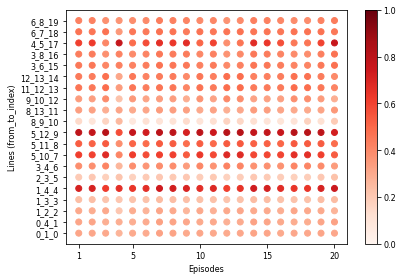

In [56]:
lines_data = np.array(res_case['lines'])
lines_df = pd.DataFrame(lines_data, columns=[obs[-1].name_line[lix] for lix in range(lines_data.shape[1])])
fig, ax = plt.subplots(1)
ax.set_ylabel('Lines (from_to_index)', fontsize=the_fontsize)
ax.set_xlabel('Episodes', fontsize=the_fontsize)
for lix in lines_df:
    im = ax.scatter(np.arange(1,21),[lix]*20, c=lines_df[lix], alpha=1, cmap=cm.Reds, vmin=0, vmax=1) # ,s=4*(20**lines_df[lix])
ax.set_xticks([1,5,10,15,20])
ax.tick_params(axis='x', labelsize=the_fontsize)
ax.tick_params(axis='y', labelsize=the_fontsize)
cbar = fig.colorbar(im, ax=ax)
cbar.ax.tick_params(labelsize=the_fontsize)

# l1 = ax.scatter([],[], s=20*4/4, edgecolors='none', c='blue', alpha=0.7)
# l2 = ax.scatter([],[], s=20*4/2, edgecolors='none', c='blue', alpha=0.7)
# l3 = ax.scatter([],[], s=20*4, edgecolors='none', c='blue', alpha=0.7)

# ax.legend([l1, l2, l3], ["0.25", "0.5", "1"], fontsize=the_fontsize, loc = 4, scatterpoints = 1)

fig.tight_layout()fig.show()

Average generator use

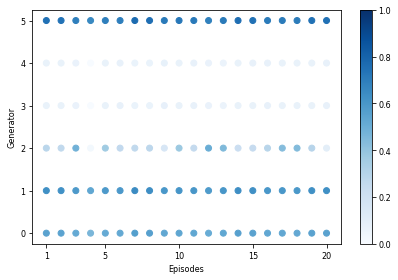

In [63]:
lines_data = np.array(res_case['gen'])
lines_df = pd.DataFrame(lines_data, columns=[lix for lix in range(lines_data.shape[1])])
fig, ax = plt.subplots(1)
ax.set_ylabel('Generator', fontsize=the_fontsize)
ax.set_xlabel('Episodes', fontsize=the_fontsize)
for lix in lines_df:
    im = ax.scatter(np.arange(1,21),[lix]*20, c=lines_df[lix], alpha=1, cmap=cm.Blues, vmin=0, vmax=1)
    #im = ax.scatter(np.arange(1,21),[lix]*20, s=4*(20**lines_df[lix]), c='blue', alpha=1, vmin=0, vmax=1)
ax.set_xticks([1,5,10,15,20])
ax.tick_params(axis='x', labelsize=the_fontsize)
ax.tick_params(axis='y', labelsize=the_fontsize)
cbar = fig.colorbar(im, ax=ax)
cbar.ax.tick_params(labelsize=the_fontsize)

# l1 = ax.scatter([],[], s=20*4/4, edgecolors='none', c='blue', alpha=0.7)
# l2 = ax.scatter([],[], s=20*4/2, edgecolors='none', c='blue', alpha=0.7)
# l3 = ax.scatter([],[], s=20*4, edgecolors='none', c='blue', alpha=0.7)

# ax.legend([l1, l2, l3], ["0.25", "0.5", "1"], fontsize=the_fontsize, loc = 4, scatterpoints = 1)

fig.tight_layout()
fig.show()

Timsteps

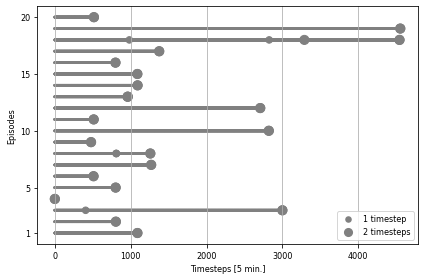

In [82]:
fig, ax = plt.subplots(1)

ax.set_ylabel('Episodes', fontsize=the_fontsize)
ax.set_xlabel('Timesteps [5 min.]', fontsize=the_fontsize)
ax.grid(axis='x')

for ep in range(20):
    ax.scatter(np.arange(len(tsteps[ep])), [ep+1]*len(tsteps[ep]), s=40*tsteps[ep]+3, alpha=1, c='grey')

l1 = ax.scatter([],[], s=40*1+3, edgecolors='none', c='grey', alpha=1)
l2 = ax.scatter([],[], s=40*2+3, edgecolors='none', c='grey', alpha=1)
ax.legend([l1, l2], ["1 timestep", "2 timesteps"], fontsize=the_fontsize, loc = 4)

ax.tick_params(axis='x', labelsize=the_fontsize)
ax.tick_params(axis='y', labelsize=the_fontsize)
ax.set_yticks([1,5,10,15,20])
fig.tight_layout()
fig.show()